In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

from matplotlib import rcParams
config = {
    "font.family":'Times New Roman',
    "mathtext.fontset":'stix',
    "font.serif": ['SimSun'],
}
rcParams.update(config)

# silence the warning note
import warnings
warnings.filterwarnings("ignore")

import sys
sys.path.append('../src/')
from findpoint import findpoint
import ModelEvaLib as me

In [2]:
chemfile = xr.open_dataset('F:/Data/case_anqing/April/April_chem.nc')

O3 = chemfile.O3

lat = chemfile.latitude
lon = chemfile.longitude

In [3]:
obspath = 'F:/Data/case_anqing/April/obsdata/all/'
sitename = [os.path.splitext(filename)[0] for filename in os.listdir(obspath) if filename.endswith('.xlsx')]
siteloc = pd.read_excel('F:/Data/case_anqing/April/obsdata/安庆市站点坐标.xlsx',header=0,index_col=0)
lono = siteloc['经度']
lato = siteloc['纬度']

df = pd.DataFrame(columns=sitename,index=pd.date_range('2023-04-01','2023-04-30T23',freq='h'))

for name in sitename:
    obsxlsx = pd.read_excel(obspath + name + '.xlsx',index_col=0)
    df[name]=obsxlsx['O3']

df = df.interpolate(method='linear')

In [5]:
lono

站点名称
安庆大学          116.98980
市人大           117.05970
环科院           117.08070
马山宾馆          117.03310
怀宁县青妇活动中心     116.82210
怀宁县振宁学校       116.83805
潜山市档案馆        116.57450
潜山市公路局        116.55390
太湖县龙山路240号    116.31330
太湖县职业技术学校     116.31240
宿松县气象局        116.12560
宿松县第二中学       116.11060
望江县人民检察院      116.68380
望江县实验中学       116.69390
岳西县气象局        116.36030
岳西县狮形小学       116.35660
桐城市开发区第二小学    116.98940
桐城市环境监测站      116.93289
安庆政务中心        117.11500
Name: 经度, dtype: float64

In [6]:
x_index=[]
y_index=[]

for name in sitename:
    out_x, out_y = findpoint(lono[name],lato[name],O3)
    x_index.append(out_x)
    y_index.append(out_y)
nr = O3.isel(x=x_index, y=y_index)

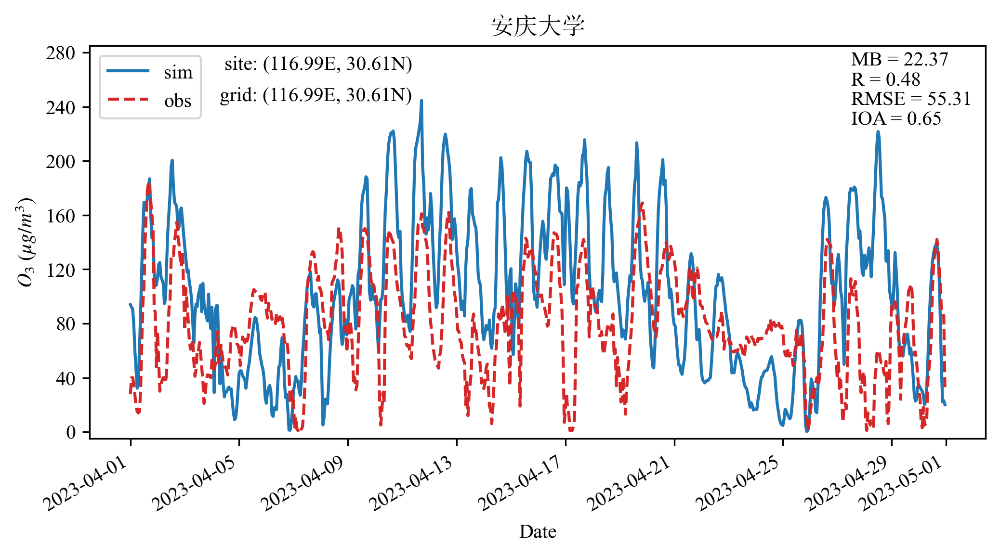

In [16]:
name = '安庆大学'
isite = 2

fig = plt.figure(figsize=(8,4),dpi=300)
ax = fig.subplots(1,1)

sim = nr[:,0,isite,isite]
obs = df[name]

sim.plot(ax=ax,linestyle='-',label='sim',color='tab:blue')
obs.plot(ax=ax,linestyle='--',label='obs',color='tab:red')

mb = np.array(np.mean(sim)-np.mean(obs))
r = pd.DataFrame({'A':sim,'B':obs}).corr().iloc[0,1]
rmse = me.cal_RMSE(obs,sim.data)
ioa = me.cal_IOA(obs,sim.data)

ax.text(x=0.85,y=0.95,s='MB = '+str(f"{mb:.2f}"),ha='left',transform=ax.transAxes)
ax.text(x=0.85,y=0.9,s='R = '+str(f"{r:.2f}"),ha='left',transform=ax.transAxes)
ax.text(x=0.85,y=0.85,s='RMSE = '+str(f"{rmse:.2f}"),ha='left',transform=ax.transAxes)
ax.text(x=0.85,y=0.8,s='IOA = '+str(f"{ioa:.2f}"),ha='left',transform=ax.transAxes)

ax.legend(loc=2)
ax.set_title(name,fontdict={'fontfamily':'SimSun'})
loctxt = 'site: ('+str(f"{lono[name]:.2f}")+'E, '+str(f"{lato[name]:.2f}")+'N)'
gridtxt = 'grid: ('+str(f"{sim.longitude.data:.2f}")+'E, '+str(f"{sim.latitude.data:.2f}")+'N)'
ax.text(x=0.36,y=0.94,s=loctxt,ha='right',transform=ax.transAxes)
ax.text(x=0.36,y=0.86,s=gridtxt,ha='right',transform=ax.transAxes)
ax.set_yticks(np.arange(0,281,40))
ax.set_ylim(-5,285)
ax.set_ylabel('$O_3$ ($\mu$$g/m^3$)')
ax.set_xlabel('Date')

plt.show()

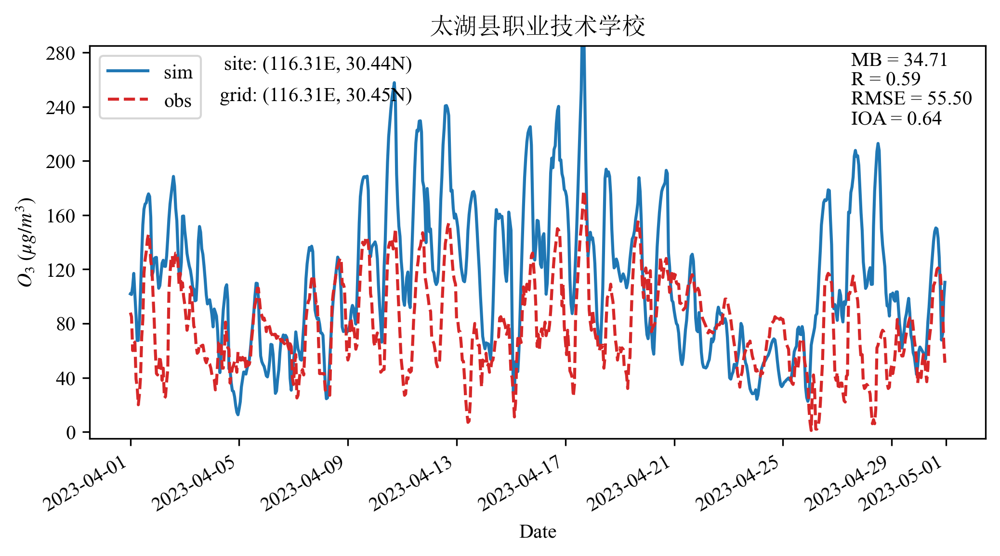

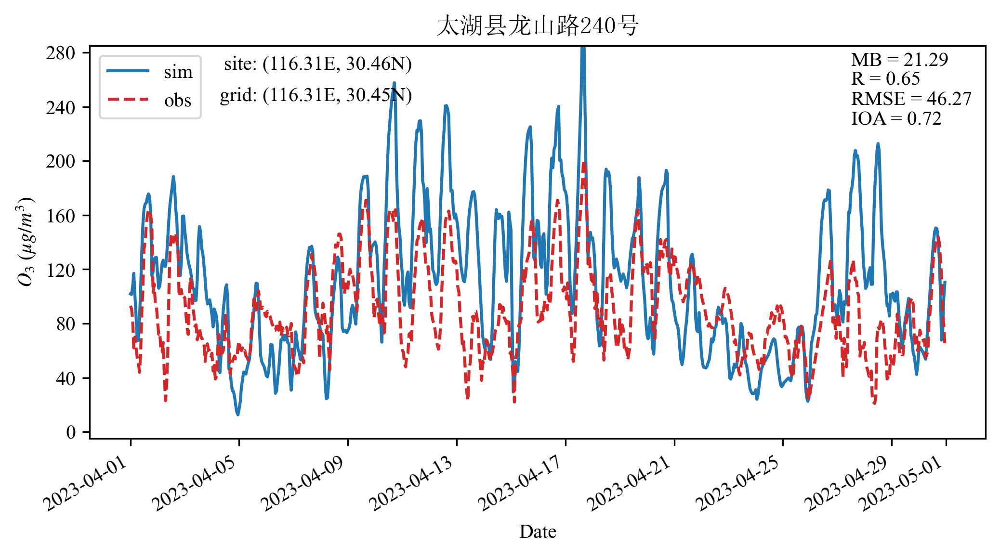

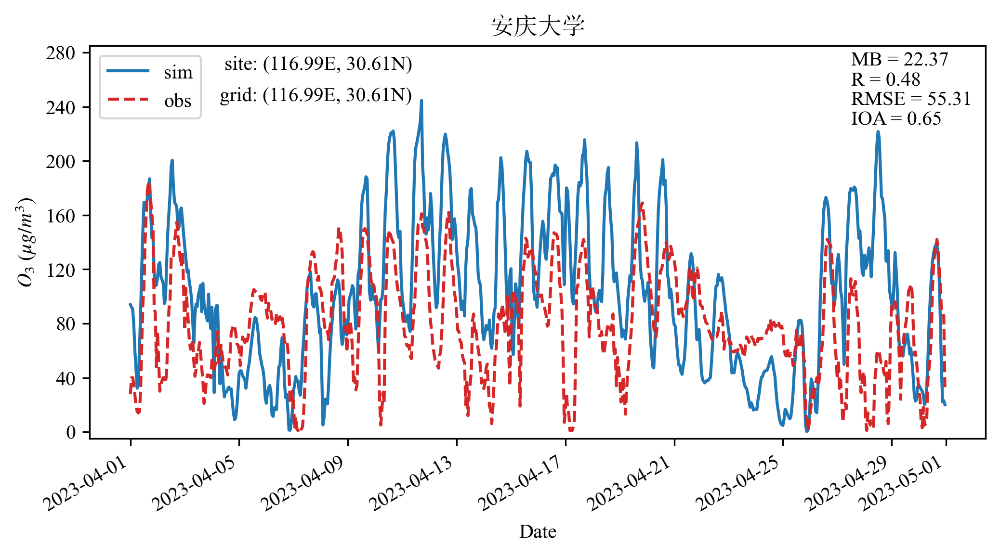

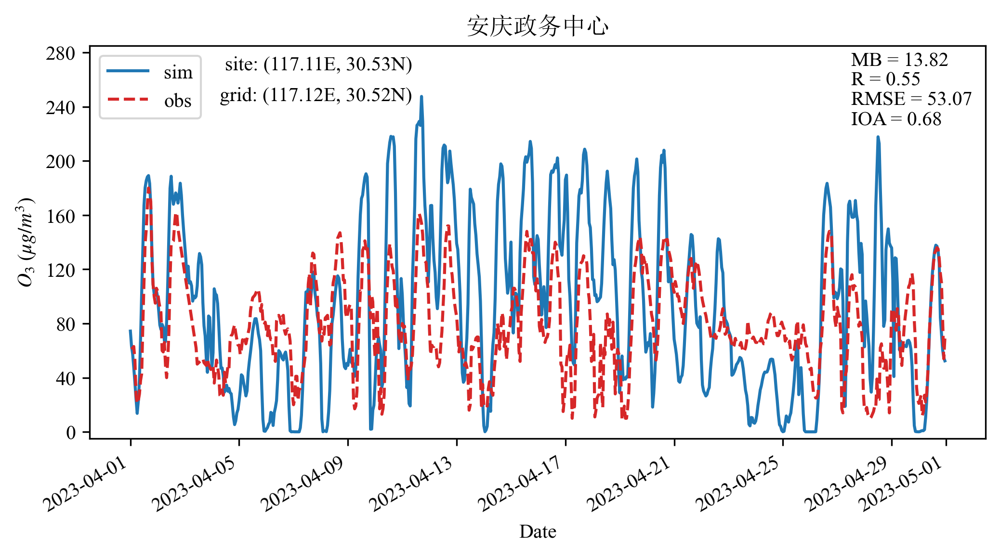

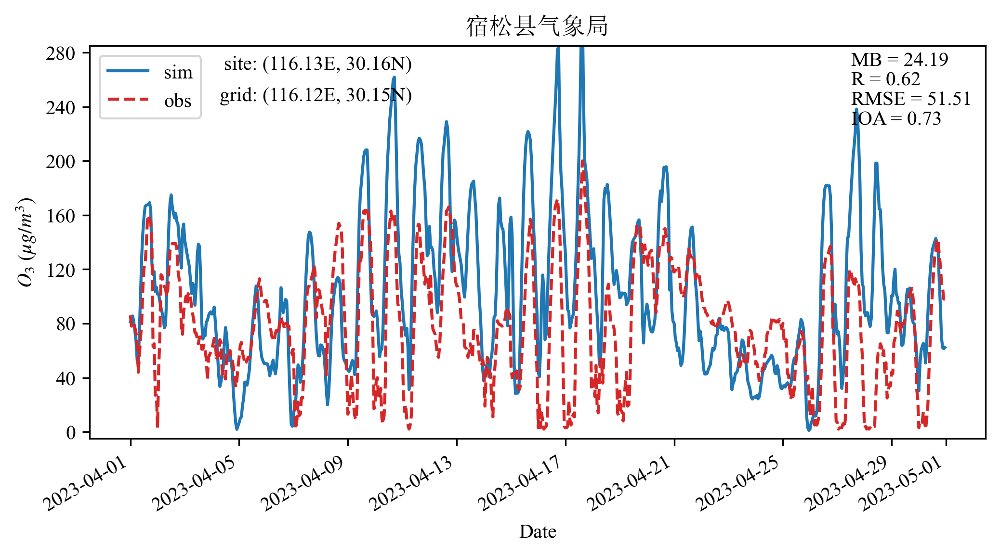

...

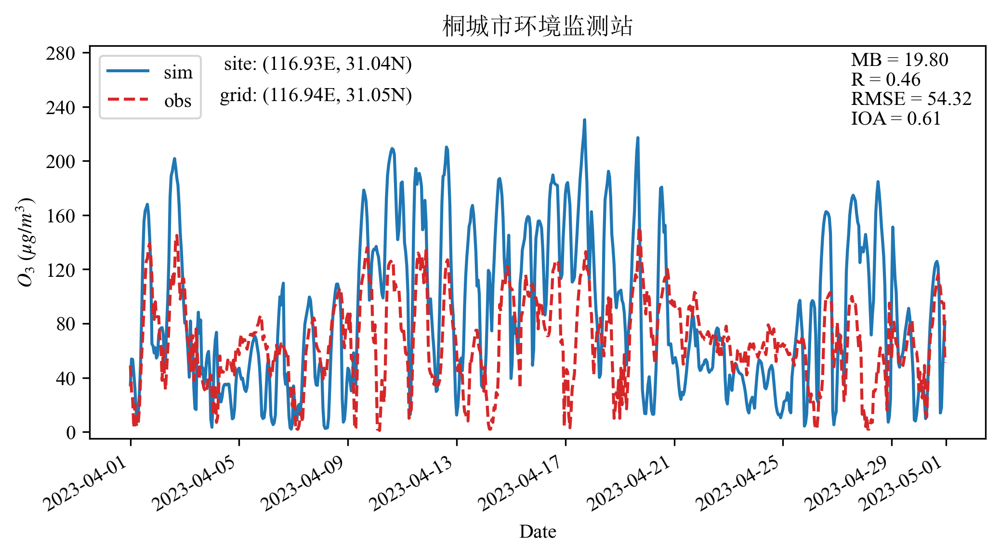

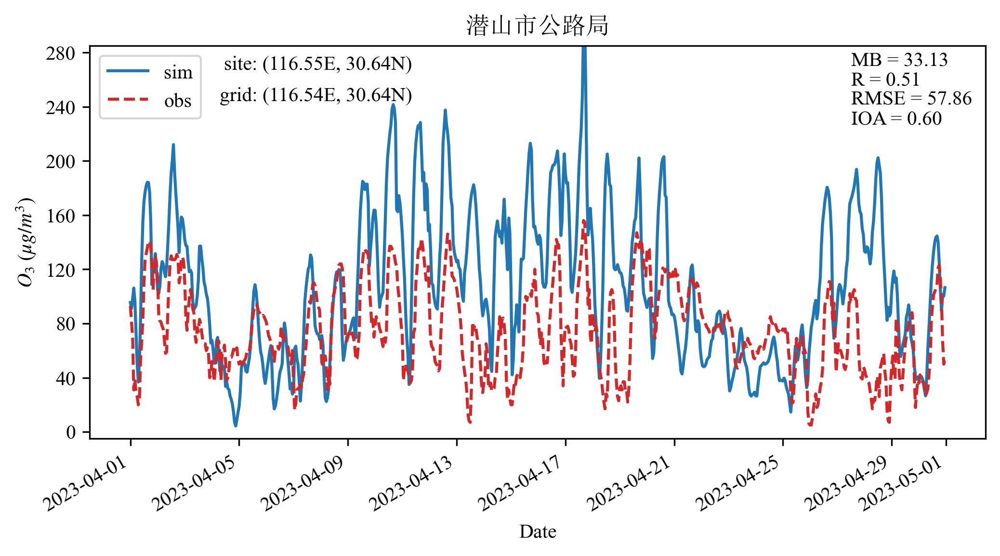

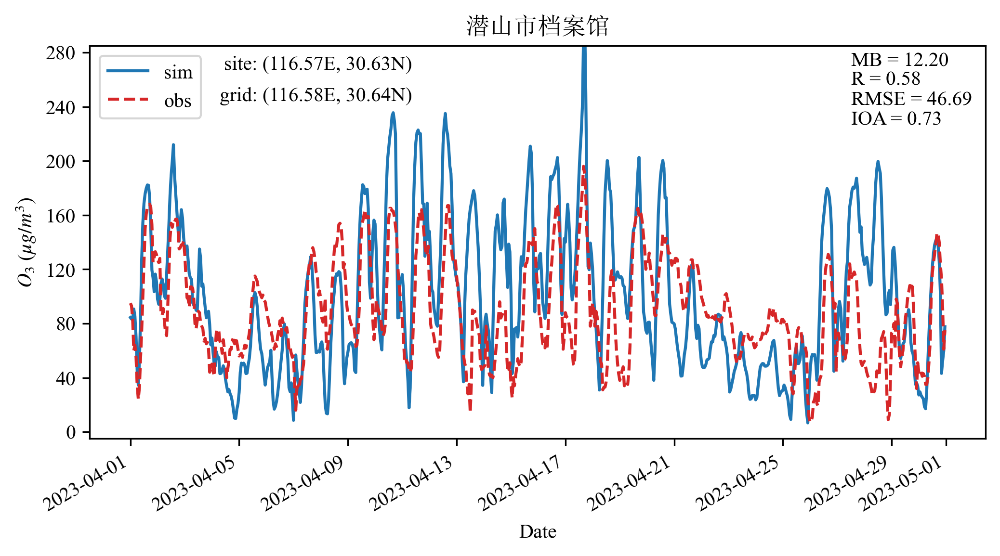

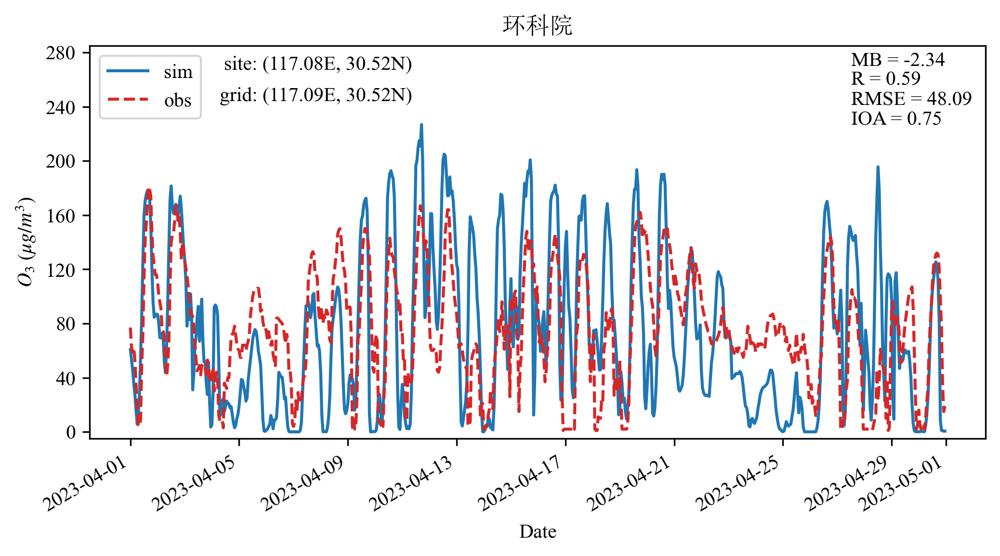

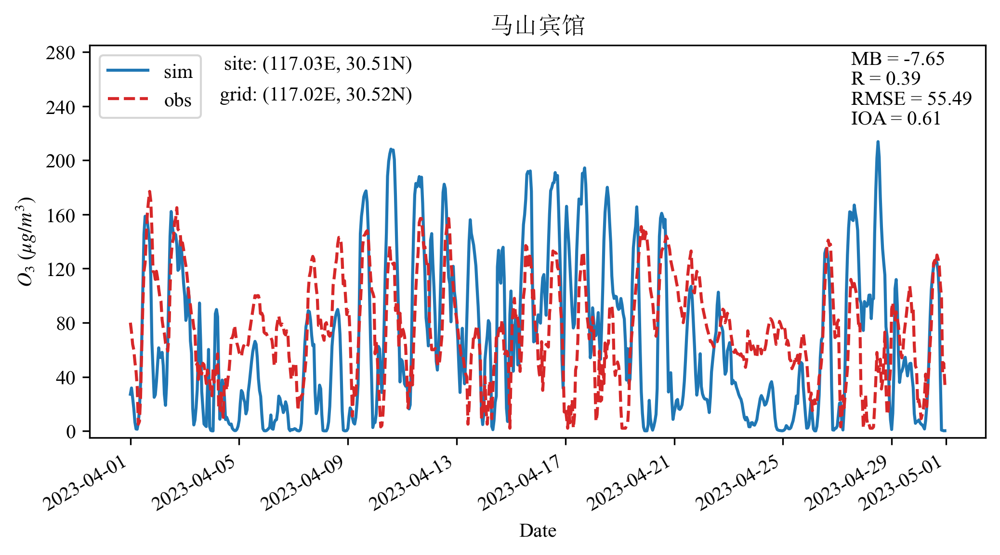

In [17]:
isite = 0
for name in sitename:
    fig = plt.figure(figsize=(8,4),dpi=300)
    ax = fig.subplots(1,1)
    sim = nr[:,0,isite,isite]
    obs = df[name]
    
    sim.plot(ax=ax,linestyle='-',label='sim',color='tab:blue')
    obs.plot(ax=ax,linestyle='--',label='obs',color='tab:red')
    
    mb = np.array(np.mean(sim)-np.mean(obs))
    r = pd.DataFrame({'A':sim,'B':obs}).corr().iloc[0,1]
    rmse = me.cal_RMSE(obs,sim.data)
    ioa = me.cal_IOA(obs,sim.data)
    
    ax.text(x=0.85,y=0.95,s='MB = '+str(f"{mb:.2f}"),ha='left',transform=ax.transAxes)
    ax.text(x=0.85,y=0.9,s='R = '+str(f"{r:.2f}"),ha='left',transform=ax.transAxes)
    ax.text(x=0.85,y=0.85,s='RMSE = '+str(f"{rmse:.2f}"),ha='left',transform=ax.transAxes)
    ax.text(x=0.85,y=0.8,s='IOA = '+str(f"{ioa:.2f}"),ha='left',transform=ax.transAxes)

    ax.legend(loc=2)
    ax.set_title(name,fontdict={'fontfamily':'SimSun'})
    loctxt = 'site: ('+str(f"{lono[name]:.2f}")+'E, '+str(f"{lato[name]:.2f}")+'N)'
    gridtxt = 'grid: ('+str(f"{sim.longitude.data:.2f}")+'E, '+str(f"{sim.latitude.data:.2f}")+'N)'
    ax.text(x=0.36,y=0.94,s=loctxt,ha='right',transform=ax.transAxes)
    ax.text(x=0.36,y=0.86,s=gridtxt,ha='right',transform=ax.transAxes)
    ax.set_yticks(np.arange(0,281,40))
    ax.set_ylabel('$O_3$ ($\mu$$g/m^3$)')
    ax.set_xlabel('Date')
    ax.set_ylim(-5,285)
    
    path = 'F:/Data/case_anqing/figure/April/逐站点/安庆O3/'
    plt.savefig(path+name+'.png')
    
    isite += 1